In [1]:
%matplotlib inline
# Importing standard Qiskit libraries and configuring account
from qiskit import QuantumCircuit, execute, Aer, IBMQ
from qiskit.compiler import transpile, assemble
from qiskit.tools.jupyter import *
from qiskit.visualization import *
from qiskit.quantum_info import DensityMatrix
# Loading your IBM Q account(s)
provider = IBMQ.load_account()

In [57]:
import cmath
import numpy as np
import matplotlib.pyplot as plt
import math
import unicodedata

if input("Real or Sim?").lower()=="real":
    backend = provider.get_backend('ibmq_'+input("Which Quantum Emulator?"))
    data_points=40
    sim=0.4
else:
    backend = Aer.get_backend('qasm_simulator')
    data_points=200
    sim=2
# Create the circuit
n = int(input('Number of qubits?'))

def coupling(circuit,q1,q2,t,f,orientation):
    if orientation == 'z':
        circuit.rz(t*f/2,q1)
        circuit.cx(q1,q2)
    elif orientation == 'x':
        circuit.rx(t*f/2,q1)
        circuit.cx(q1,q2)
    elif orientation == 'y':
        circuit.ry(t*f/2,q1)
        circuit.cx(q1,q2)
    else:
        print('Invalid orientation')
    return circuit

def magnetic(circuit,q,t,f,orientation):
    if orientation == 'z':
        circuit.rz(t*f,q)
    elif orientation == 'x':
        circuit.rx(t*f,q)
    elif orientation == 'y':
        circuit.ry(t*f,q)
    else:
        print('Invalid orientation')
    return circuit

def pi_pulse(circuit,qubits):
    circuit.x(qubits)
    return circuit

def measure(qubits):
    circuit=QuantumCircuit(n,n)
    circuit.measure(qubits,qubits)
    return circuit

circuits=[]
period = 0
exp_period=[]
densities=[]
freq1 = 20
freq2 = 50
freq3 = 5
for t in range(0,data_points):
    t = t

    circuit = ''
    circuit=QuantumCircuit(n,n)
    circuit.h([0,1,2])
    coupling(circuit,0,2,t/data_points,freq1,'z')
    coupling(circuit,1,0,t/data_points,freq2,'z')
    coupling(circuit,2,1,t/data_points,freq3,'z')

    pi_pulse(circuit,[0,1,2])
    circuit.h([0,1,2])
    coupling(circuit,0,2,t/2/data_points,freq1,'z')
    coupling(circuit,1,0,t/2/data_points,freq2,'z')
    coupling(circuit,2,1,t/2/data_points,freq3,'z')
    pi_pulse(circuit,[0,1,2])
    
    circuit.h([0,1])
    coupling(circuit,0,2,t/2/data_points,freq1,'z')
    coupling(circuit,1,0,t/2/data_points,freq2,'z')
    circuit.h([0,1,2])
    
    circuits.append(circuit+measure([0,1,2]))
    densities.append(DensityMatrix.from_instruction(circuit))
    exp_period.append(t/sim/2)

    
    
# Execute the circuits
shots = 1024
job = execute(circuits, backend,
              shots=shots, seed_simulator=8)
result = job.result()



Real or Sim?sim
Number of qubits?3


0.29736004140898514


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:122: RankWarning: Polyfit may be poorly conditioned
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:123: RankWarning: Polyfit may be poorly conditioned
/opt/conda/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3343: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)


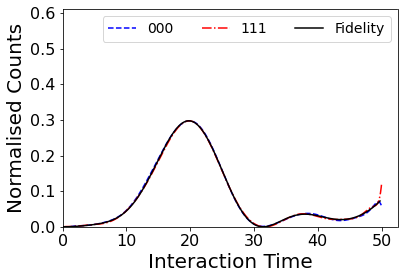

0.3140564447073538


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:125: RankWarning: Polyfit may be poorly conditioned
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:126: RankWarning: Polyfit may be poorly conditioned
/opt/conda/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3343: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)


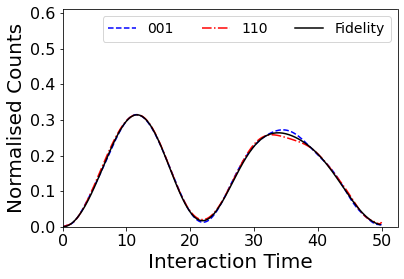

0.4999999999999993


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:128: RankWarning: Polyfit may be poorly conditioned
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:129: RankWarning: Polyfit may be poorly conditioned
/opt/conda/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3343: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)


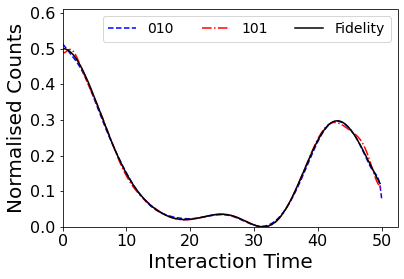

0.30022253450884384


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:131: RankWarning: Polyfit may be poorly conditioned
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:132: RankWarning: Polyfit may be poorly conditioned
/opt/conda/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3343: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)


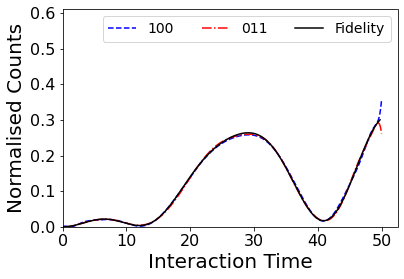

In [58]:
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt

for state in ['000','001','010','100']:
    fidelities = []
    for num,j in enumerate(densities):
        if state=='000':
            fidelities.append(np.absolute(np.trace(np.array([[1/2,0,0,0,0,0,0,1/2],\
                                                          [0,0,0,0,0,0,0,0],\
                                                          [0,0,0,0,0,0,0,0],\
                                                          [0,0,0,0,0,0,0,0],\
                                                          [0,0,0,0,0,0,0,0],\
                                                          [0,0,0,0,0,0,0,0],\
                                                          [0,0,0,0,0,0,0,0],\
                                                          [1/2,0,0,0,0,0,0,1/2]])*j.data)))
        elif state == '001':
            fidelities.append(np.absolute(np.trace(np.array([[0,0,0,0,0,0,0,0],\
                                                          [0,1/2,0,0,0,0,1/2,0],\
                                                          [0,0,0,0,0,0,0,0],\
                                                          [0,0,0,0,0,0,0,0],\
                                                          [0,0,0,0,0,0,0,0],\
                                                          [0,0,0,0,0,0,0,0],\
                                                          [0,1/2,0,0,0,0,1/2,0],\
                                                          [0,0,0,0,0,0,0,0]])*j.data)))
        elif state == '010':
            fidelities.append(np.absolute(np.trace(np.array([[0,0,0,0,0,0,0,0],\
                                                          [0,0,0,0,0,0,0,0],\
                                                          [0,0,1/2,0,0,1/2,0,0],\
                                                          [0,0,0,0,0,0,0,0],\
                                                          [0,0,0,0,0,0,0,0],\
                                                          [0,0,1/2,0,0,1/2,0,0],\
                                                          [0,0,0,0,0,0,0,0],\
                                                          [0,0,0,0,0,0,0,0]])*j.data)))
        else:
            fidelities.append(np.absolute(np.trace(np.array([[0,0,0,0,0,0,0,0],\
                                                          [0,0,0,0,0,0,0,0],\
                                                          [0,0,0,0,0,0,0,0],\
                                                          [0,0,0,1/2,1/2,0,0,0],\
                                                          [0,0,0,1/2,1/2,0,0,0],\
                                                          [0,0,0,0,0,0,0,0],\
                                                          [0,0,0,0,0,0,0,0],\
                                                          [0,0,0,0,0,0,0,0]])*j.data)))

    data_000=[]
    data_001=[]
    data_010=[]
    data_100=[]
    data_011=[]
    data_101=[]
    data_110=[]
    data_111=[]

    exp_error=[]
    target = []

    for exp_index in circuits:
        data = result.get_counts(exp_index)
        try:
            p000 = data['000']/shots
        except KeyError:
            p000 = 0
        try:
            p001 = data['001']/shots
        except KeyError:
            p001 = 0
        try:
            p010 = data['010']/shots
        except KeyError:
            p010 = 0
        try:
            p100 = data['100']/shots
        except KeyError:
            p100 = 0
        try:
            p011 = data['011']/shots
        except KeyError:
            p011 = 0
        try:
            p101 = data['101']/shots
        except KeyError:
            p101 = 0
        try:
            p110 = data['110']/shots
        except KeyError:
            p110 = 0
        try:
            p111 = data['111']/shots
        except KeyError:
            p111 = 0
        data_000.append(p000)
        data_001.append(p001)
        data_010.append(p010)
        data_100.append(p100)
        data_011.append(p011)
        data_101.append(p101)
        data_110.append(p110)
        data_111.append(p111)
        exp_error.append(np.sqrt(p000*(1-p000)/shots))

    # Plot the results
    def plot(exp_period, exp_data, label, style,color):
        polynomial = np.polyfit(exp_period, exp_data,21)
        Xs = [i/100 for i in range(0,math.ceil(max(exp_period))*100)]
        Ys = []
        for i in Xs:
            Y=0
            for a,j in enumerate(polynomial):
                Y+=j*i**(len(polynomial)-a-1)
            Ys.append(Y)
        plt.plot(Xs,Ys, label = label, linestyle=style,color=color)
        #plt.scatter(exp_period, exp_data, marker = 'x')    
        #plt.plot(exp_period, exp_data, label = label, color=color,linestyle=style)
        plt.xlabel('Interaction Time', fontsize=20)
        plt.ylabel('Normalised Counts', fontsize=20)
        plt.ylim(0,0.61)
        plt.xlim(0)
        plt.grid(False) 
    print(max(fidelities))
    if state=='000':
        plot(exp_period, data_000, '000','--','b')
        plot(exp_period, data_111, '111','-.','r')
    elif state == '001':
        plot(exp_period, data_001, '001','--','b')
        plot(exp_period, data_110, '110','-.','r')
    elif state == '010':
        plot(exp_period, data_010, '010','--','b')
        plot(exp_period, data_101, '101','-.','r')
    else:
        plot(exp_period, data_100, '100','--','b')
        plot(exp_period, data_011, '011','-.','r')  

    polynomial = np.polyfit(exp_period, fidelities, 21)
    Xs_2 = [i/100 for i in range(0,math.ceil(max(exp_period)*100))]
    Ys_2 = []
    for i in Xs_2:
        Y=0
        for a,j in enumerate(polynomial):
            Y+=j*i**(len(polynomial)-a-1)
        Ys_2.append(Y)
    plt.plot(exp_period, fidelities, label='Fidelity', linestyle='-',color='k')  
    #plt.plot(Xs_2,Ys_2,label='Fidelity', linestyle='-',color='k')
    plt.legend(fontsize=14, loc='best',ncol=3)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    plt.show()


In [ ]:
for t in range(0,data_points):
    t = t

    circuit = ''
    circuit=QuantumCircuit(n,n)
    circuit.h([0,1,2])
    coupling(circuit,0,2,t/data_points,freq1,'z')
    coupling(circuit,1,0,t/data_points,freq2,'z')
    coupling(circuit,2,1,t/data_points,freq3,'z')

    pi_pulse(circuit,[0,1,2])
    circuit.h([0,1,2])
    coupling(circuit,0,2,t/2/data_points,freq1,'z')
    coupling(circuit,1,0,t/2/data_points,freq2,'z')
    coupling(circuit,2,1,t/2/data_points,freq3,'z')
    
    pi_pulse(circuit,[2])
    circuit.h([0,1])
    coupling(circuit,0,1,t/2/data_points,freq,'z')
    circuit.h([0,1])
    
    circuits.append(circuit+measure([0,1]))
    densities.append(DensityMatrix.from_instruction(circuit))
    exp_period.append(t/sim/2)

/opt/conda/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3343: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)


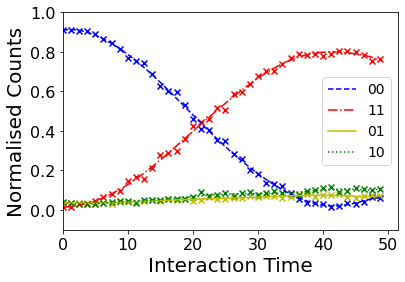

/opt/conda/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3343: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)
No handles with labels found to put in legend.


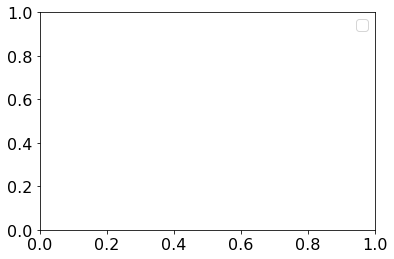

In [26]:
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt

for state in ['00','01']:
    fidelities = []
    for num,j in enumerate(densities):
        if state=='00':
            fidelities.append(np.absolute(np.trace(np.array([[1/2,0,0,1/2],\
                                                          [0,0,0,0],\
                                                          [0,0,0,0],\
                                                          [1/2,0,0,1/2]])*j.data)))
        elif state == '01':
            fidelities.append(np.absolute(np.trace(np.array([[0,0,0,0],\
                                                          [0,1/2,1/2,0],\
                                                          [0,1/2,1/2,0],\
                                                          [0,0,0,0]])*j.data)))
        

    data_00=[]
    data_01=[]
    data_10=[]
    data_11=[]

    exp_error=[]
    target = []

    for exp_index in circuits:
        data = result.get_counts(exp_index)
        #print(data)
        try:
            p00 = data['00']/shots
        except KeyError:
            p00 = 0
        try:
            p01 = data['01']/shots
        except KeyError:
            p01 = 0
        try:
            p10 = data['10']/shots
        except KeyError:
            p10 = 0
        try:
            p11 = data['11']/shots
        except KeyError:
            p11 = 0
        data_00.append(p00)
        data_01.append(p01)
        data_10.append(p10)
        data_11.append(p11)
        exp_error.append(np.sqrt(p00*(1-p00)/shots))

    # Plot the results
    def plot(exp_period, exp_data, label, style,color):
        polynomial = np.polyfit(exp_period, exp_data,9)
        Xs = [i/100 for i in range(0,math.ceil(max(exp_period))*100)]
        Ys = []
        for i in Xs:
            Y=0
            for a,j in enumerate(polynomial):
                Y+=j*i**(len(polynomial)-a-1)
            Ys.append(Y)
        plt.plot(Xs,Ys, label = label, linestyle=style,color=color)
        plt.scatter(exp_period, exp_data, marker = 'x', color=color)    
        #plt.plot(exp_period, exp_data, marker='x', linestyle='None',color=color)
        plt.xlabel('Interaction Time', fontsize=20)
        plt.ylabel('Normalised Counts', fontsize=20)
        plt.ylim(-0.1,1)
        plt.xlim(0)
        plt.grid(False) 

    if state=='00':
        plot(exp_period, data_00, '00','--','b')
        plot(exp_period, data_11, '11','-.','r')
    #elif state == '01':
        plot(exp_period, data_01, '01','-','y')
        plot(exp_period, data_10, '10',':','g')
    
    polynomial = np.polyfit(exp_period, fidelities, 21)
    Xs_2 = [i/100 for i in range(0,math.ceil(max(exp_period)*100))]
    Ys_2 = []
    for i in Xs_2:
        Y=0
        for a,j in enumerate(polynomial):
            Y+=j*i**(len(polynomial)-a-1)
        Ys_2.append(Y)
    #plt.plot(exp_period, fidelities, label='Fidelity', linestyle='-',color='k')  
    #plt.plot(Xs_2,Ys_2,label='Fidelity', linestyle='-',color='k')
    plt.legend(fontsize=14, loc='best')
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    plt.show()


0.0


/opt/conda/lib/python3.7/site-packages/mpl_toolkits/mplot3d/axes3d.py:2428: ComplexWarning: Casting complex values to real discards the imaginary part
  polys[..., i] = p + dp * cuboid[..., i]
/opt/conda/lib/python3.7/site-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


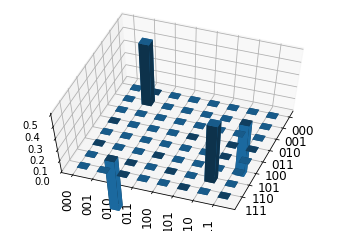

0.375


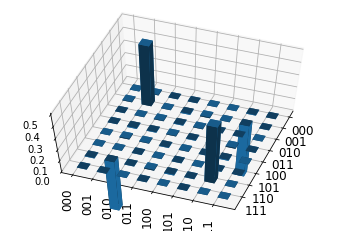

0.75


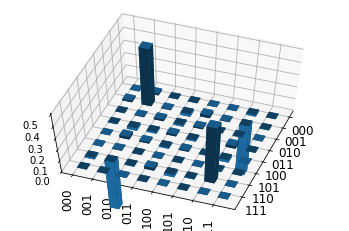

1.125


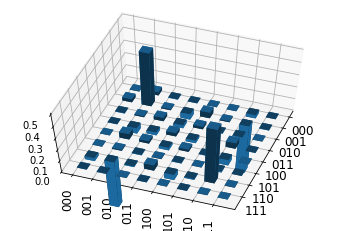

1.5


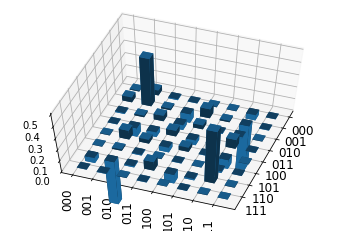

1.875


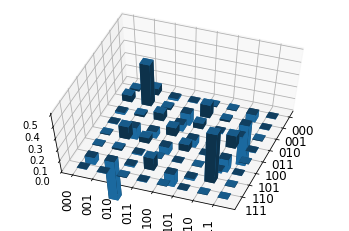

2.25


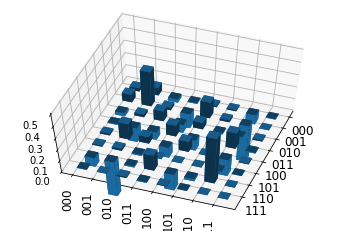

2.625


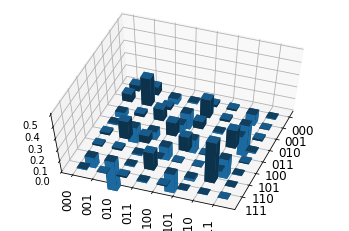

3.0


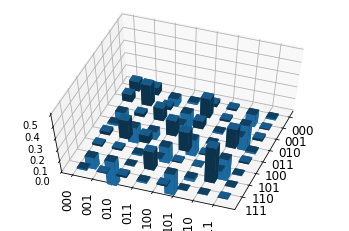

3.375


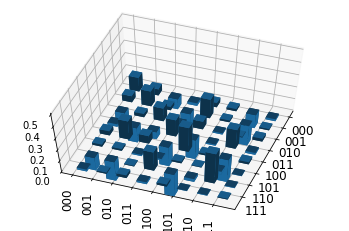

3.75


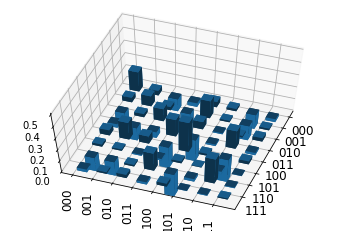

4.125


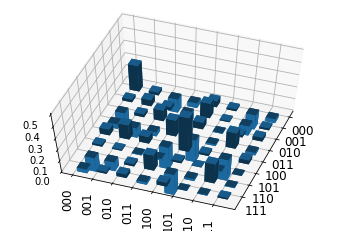

4.5


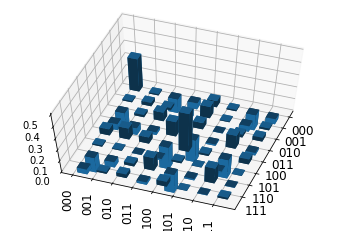

4.875


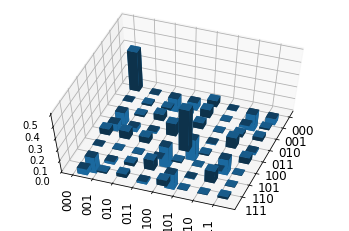

5.25


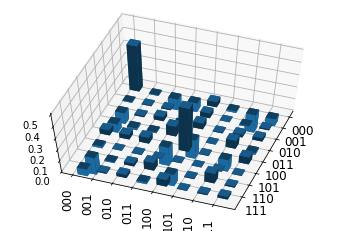

5.625


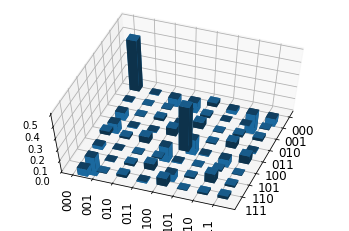

6.0


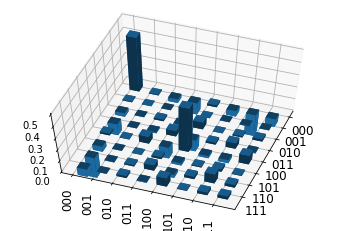

6.375


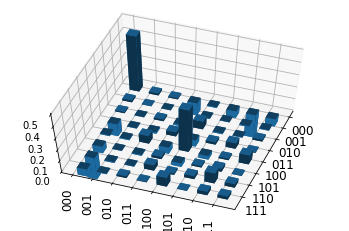

6.75


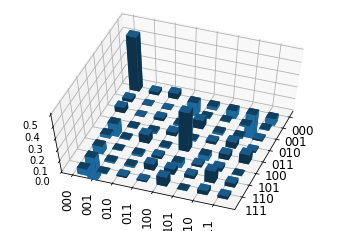

7.125


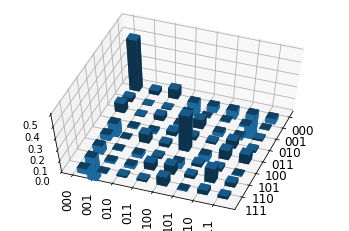

7.5


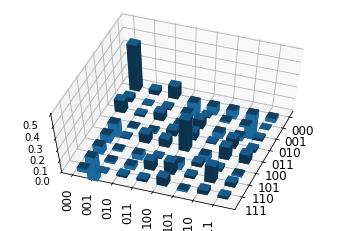

7.875


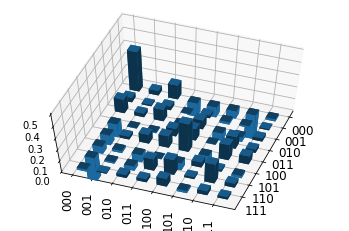

8.25


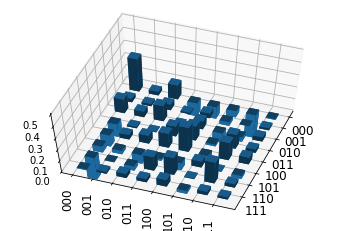

8.625


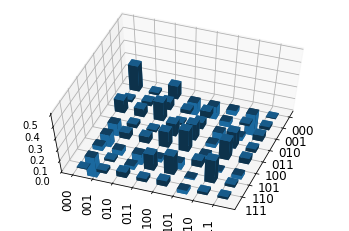

9.0


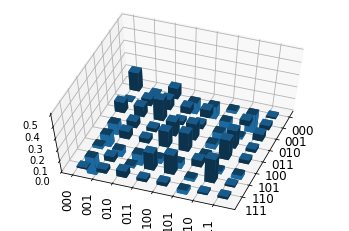

9.375


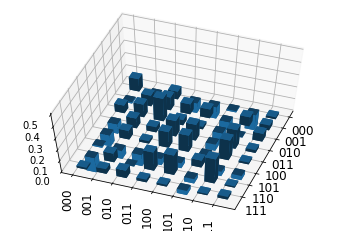

9.75


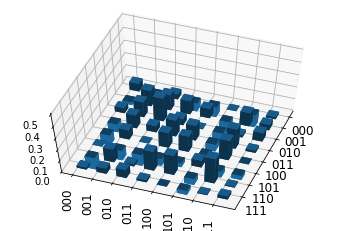

10.125


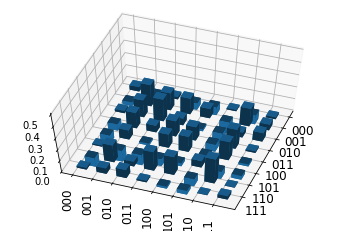

10.5


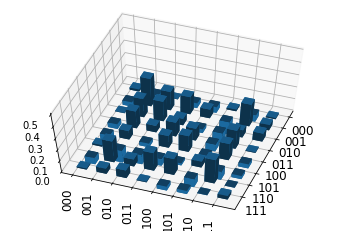

10.875


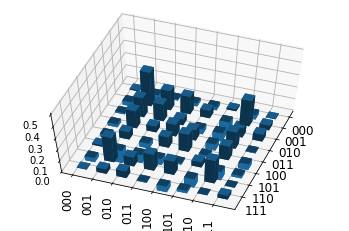

11.25


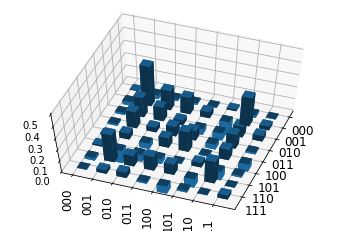

11.625


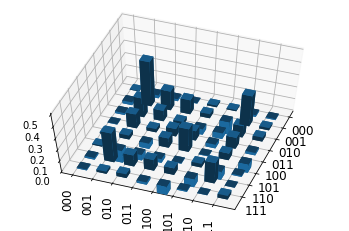

12.0


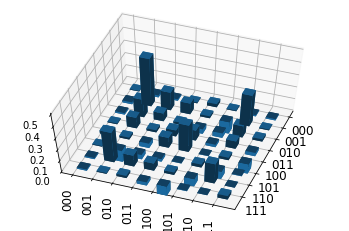

12.375


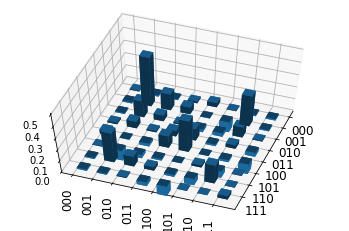

12.75


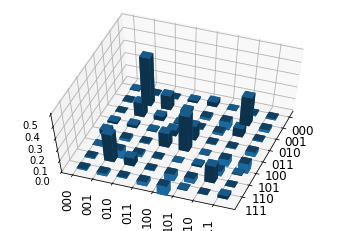

13.125


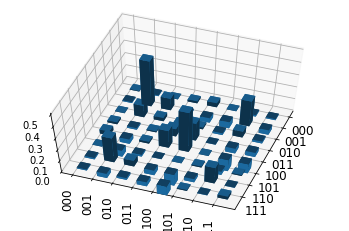

13.5


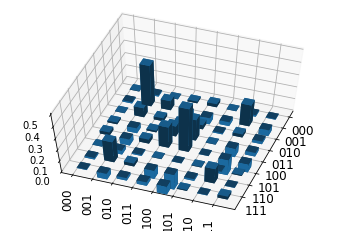

13.875


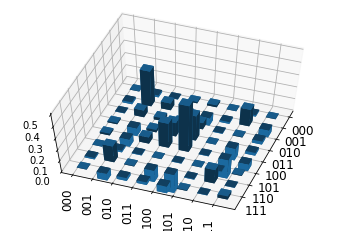

14.25


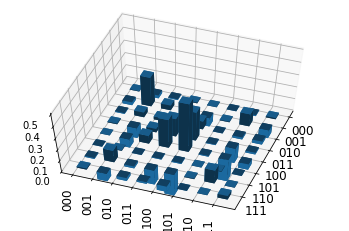

14.625


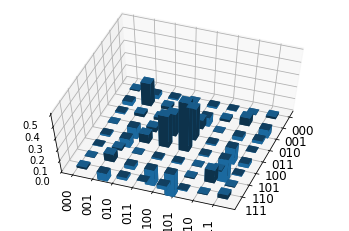

15.0


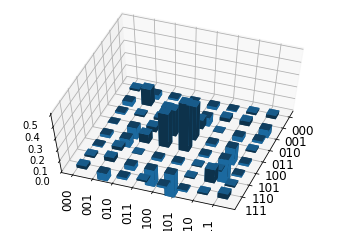

15.375


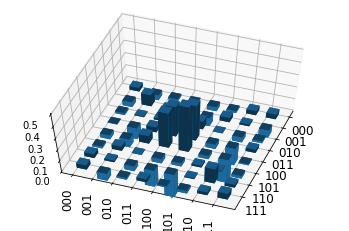

15.75


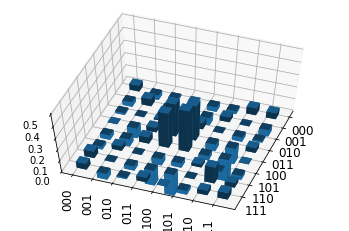

16.125


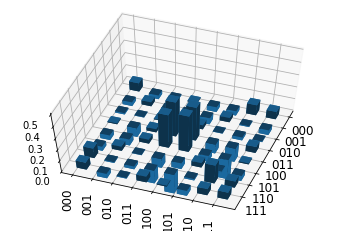

16.5


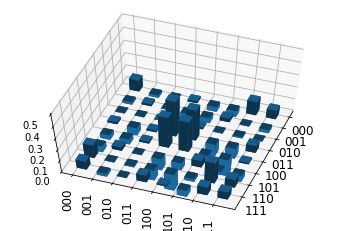

16.875


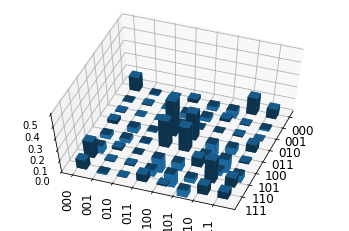

17.25


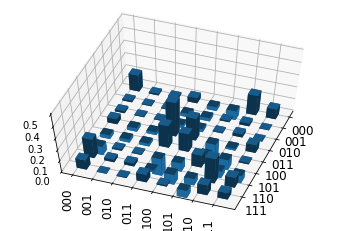

17.625


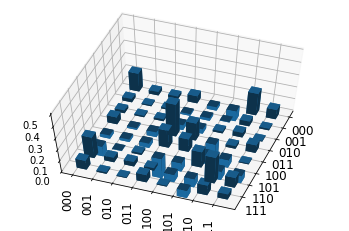

18.0


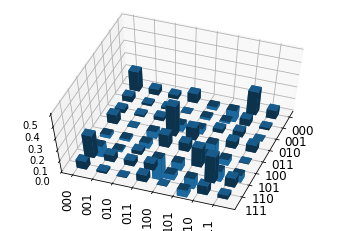

18.375


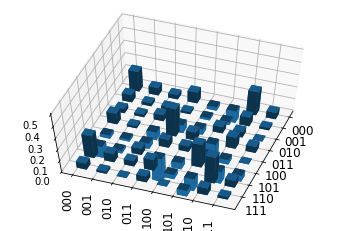

18.75


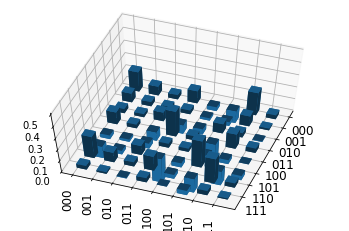

19.125


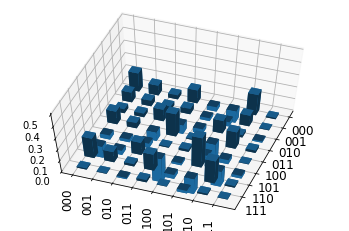

19.5


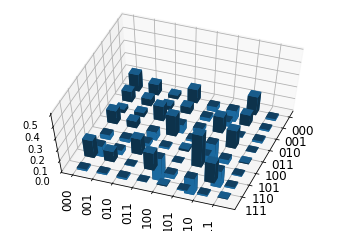

19.875


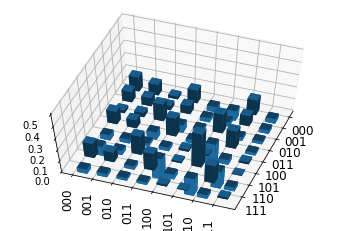

20.25


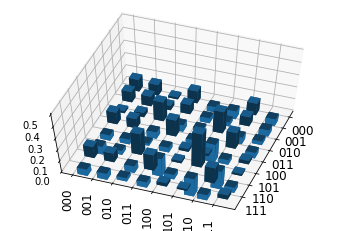

20.625


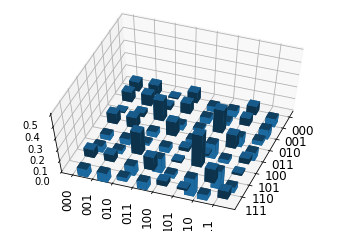

21.0


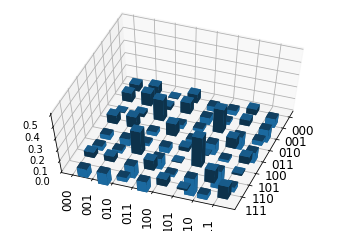

21.375


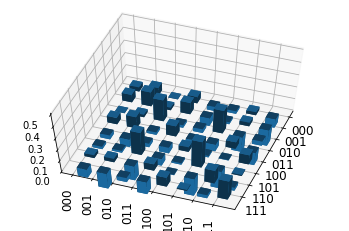

21.75


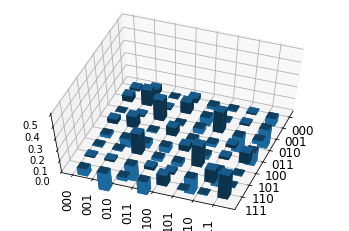

22.125


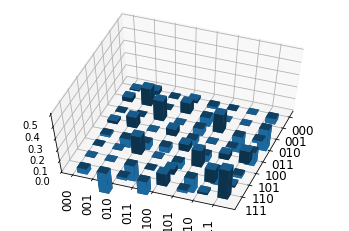

22.5


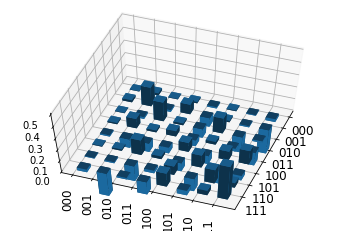

22.875


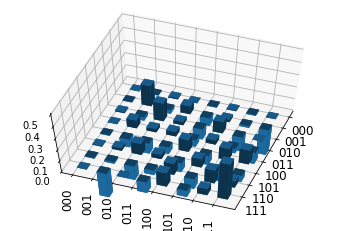

23.25


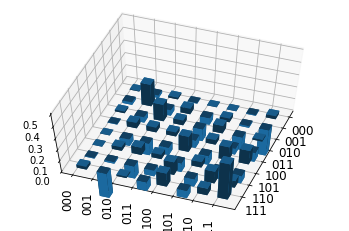

23.625


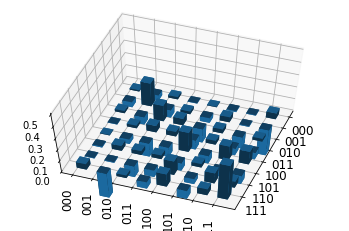

24.0


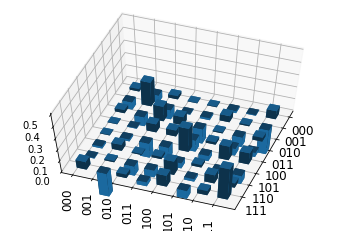

24.375


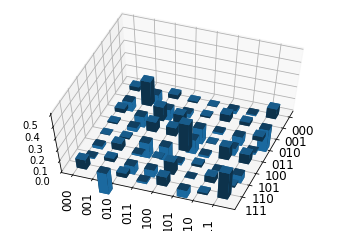

24.75


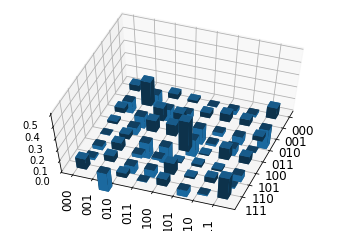

25.125


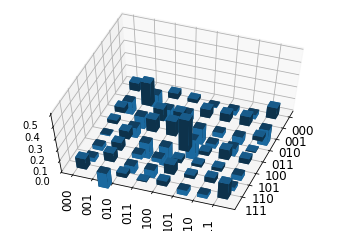

25.5


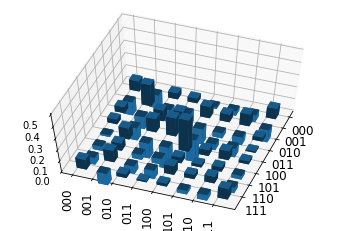

25.875


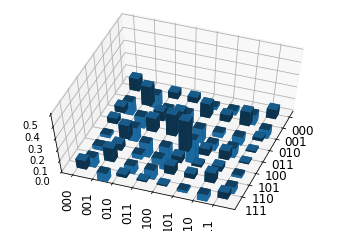

26.25


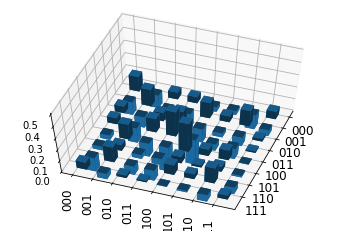

26.625


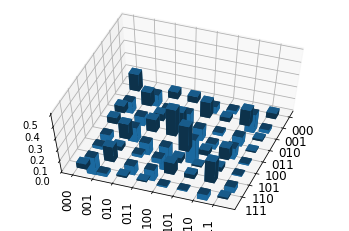

27.0


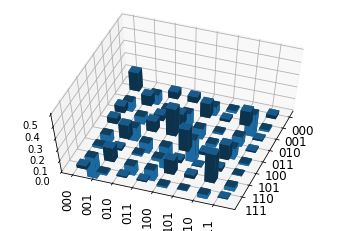

27.375


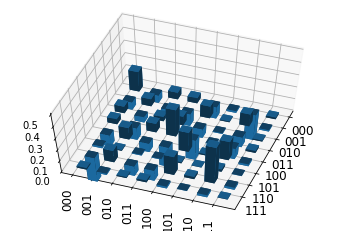

27.75


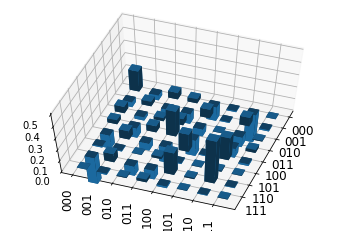

28.125


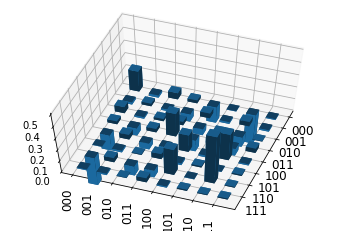

28.5


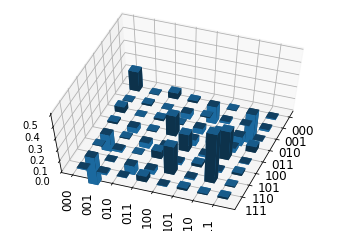

28.875


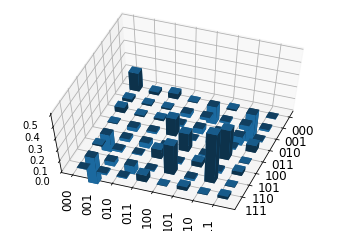

29.25


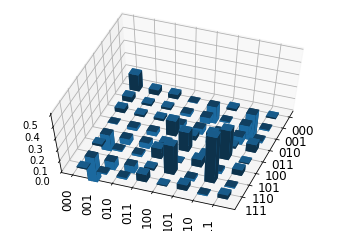

29.625


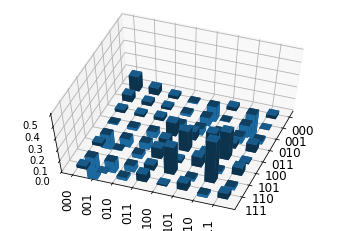

30.0


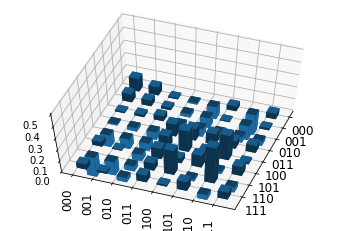

30.375


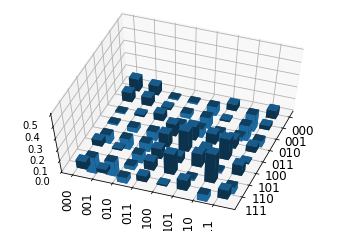

30.75


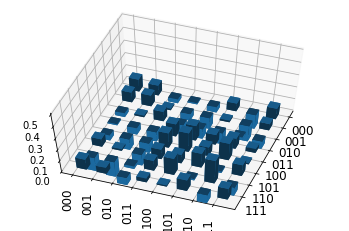

31.125


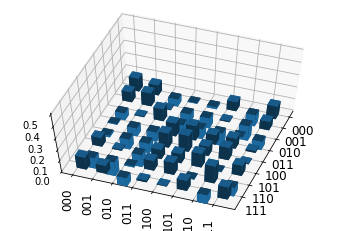

31.5


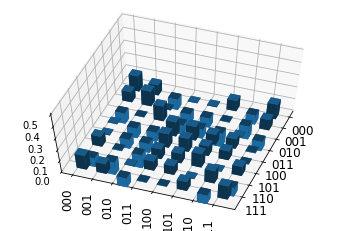

31.875


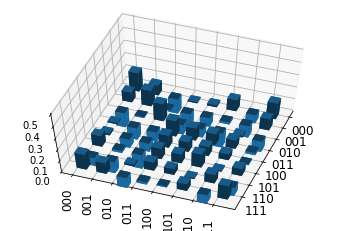

32.25


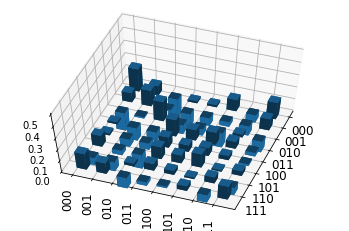

32.625


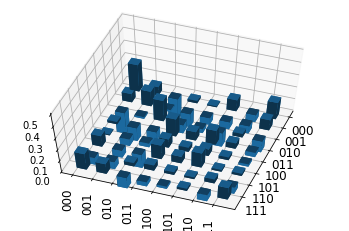

33.0


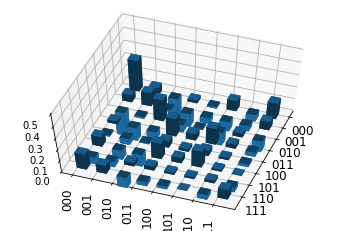

33.375


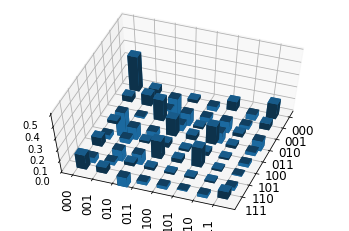

33.75


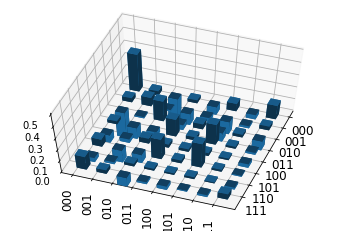

34.125


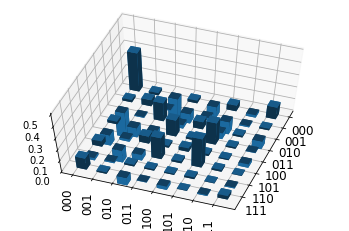

34.5


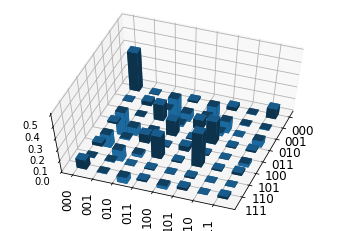

34.875


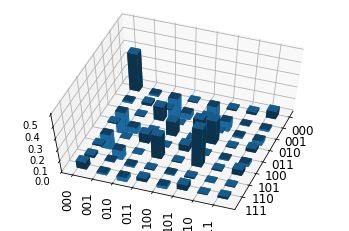

35.25


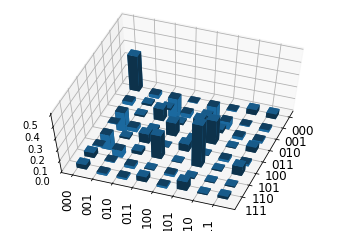

35.625


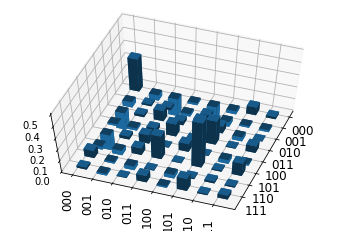

36.0


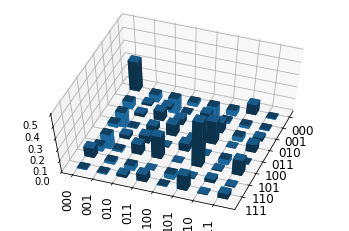

36.375


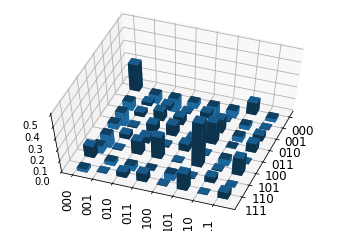

36.75


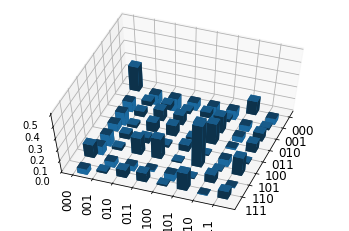

37.125


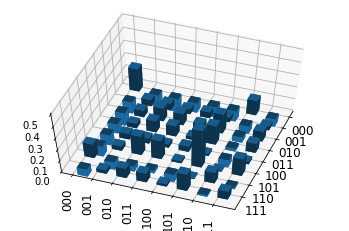

37.5


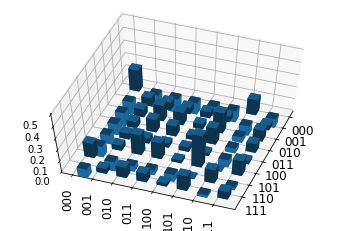

37.875


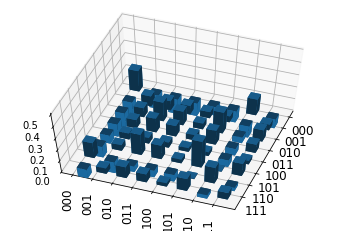

38.25


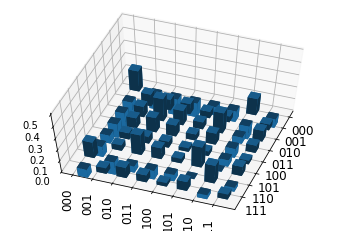

38.625


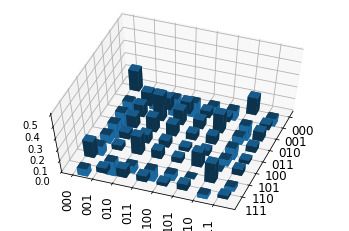

39.0


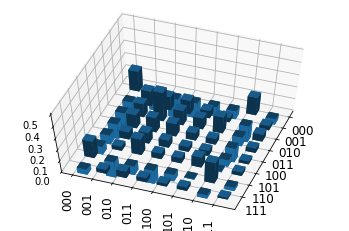

39.375


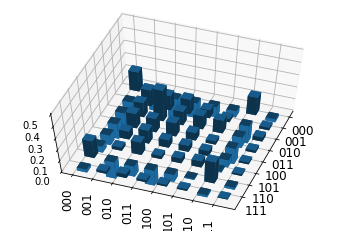

39.75


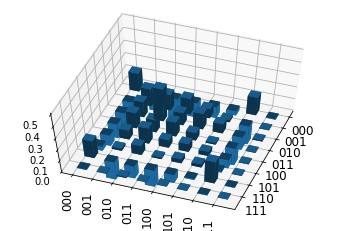

40.125


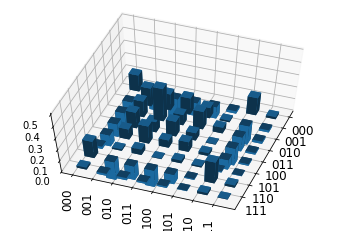

40.5


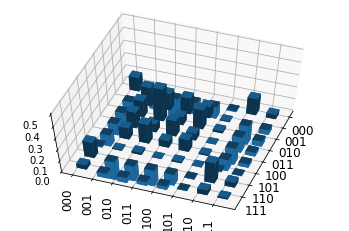

40.875


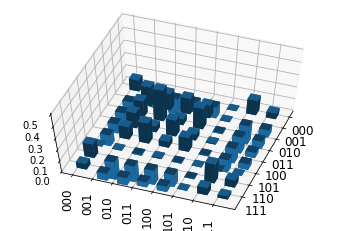

41.25


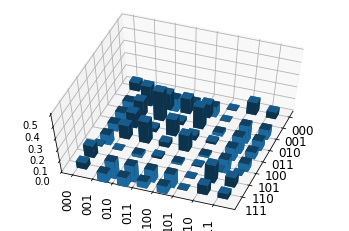

41.625


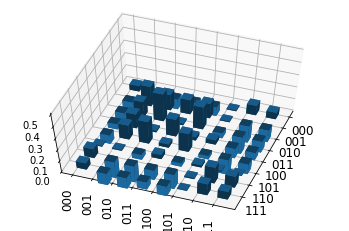

42.0


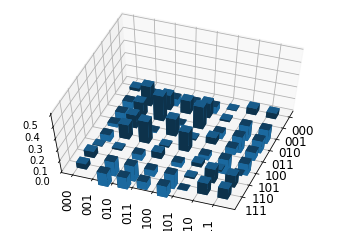

42.375


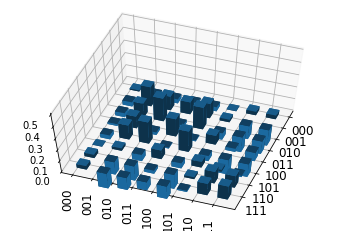

42.75


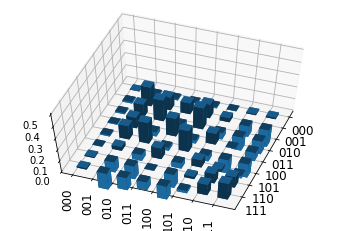

43.125


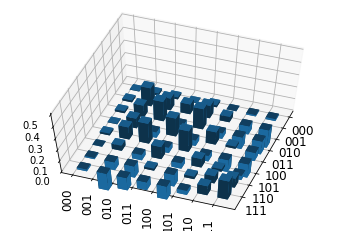

43.5


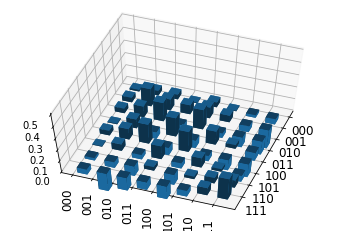

43.875


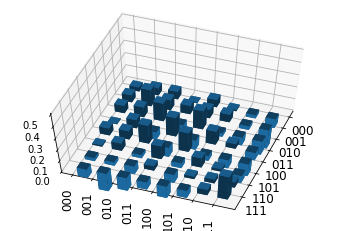

44.25


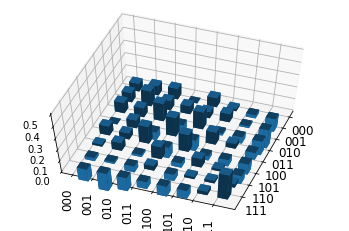

44.625


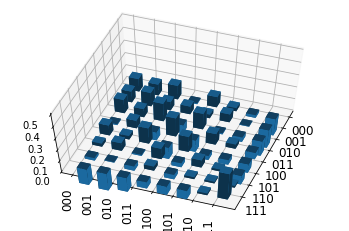

45.0


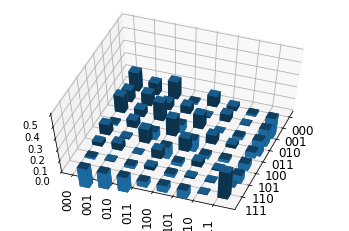

45.375


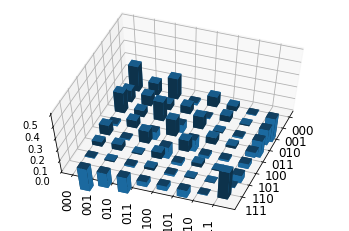

45.75


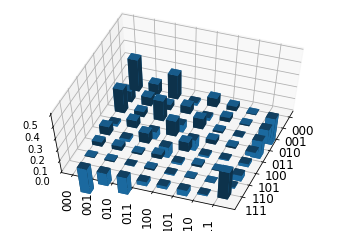

46.125


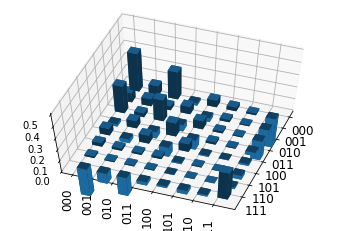

46.5


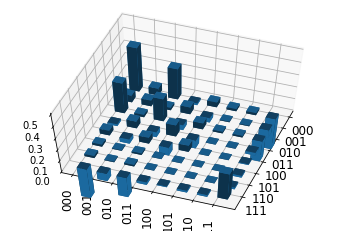

46.875


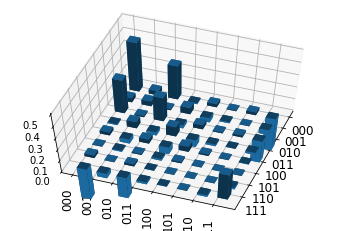

47.25


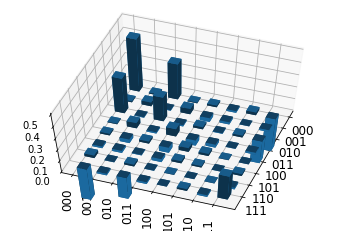

47.625


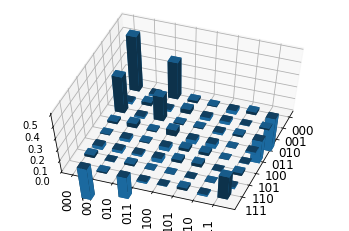

48.0


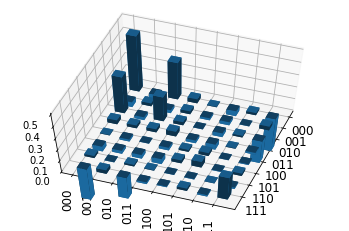

48.375


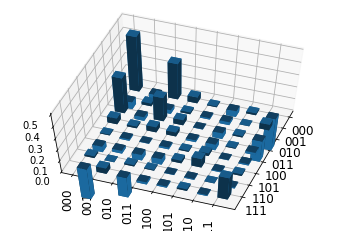

48.75


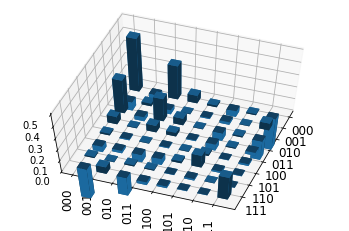

49.125


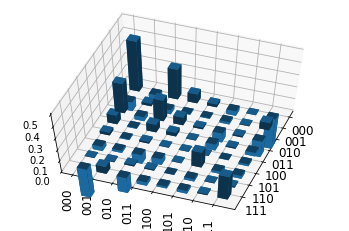

49.5


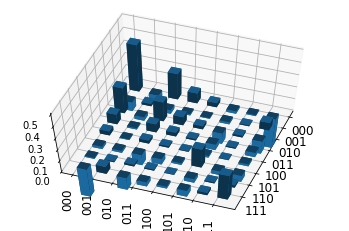

49.875


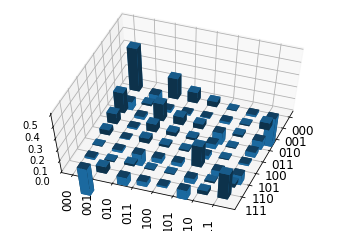

50.25


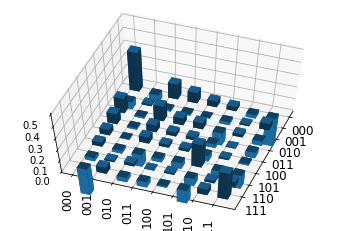

50.625


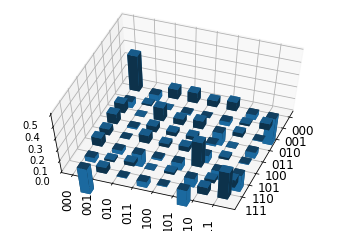

51.0


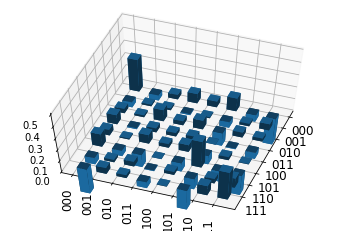

51.375


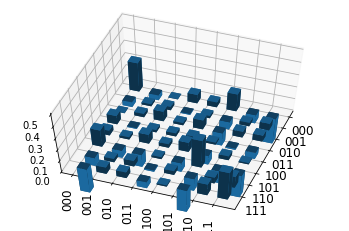

51.75


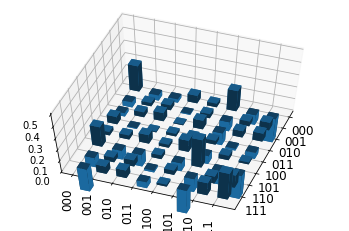

52.125


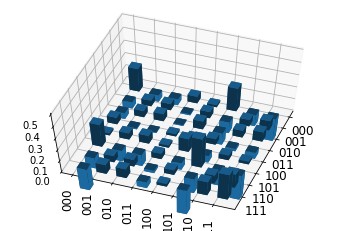

52.5


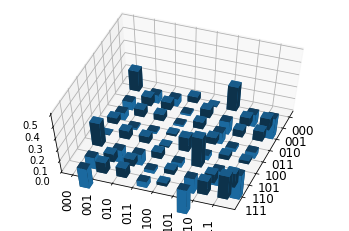

52.875


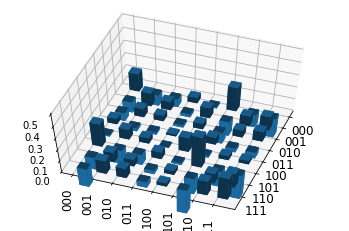

53.25


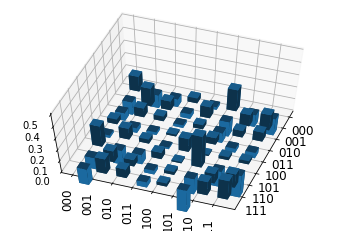

53.625


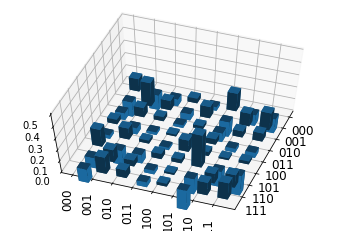

54.0


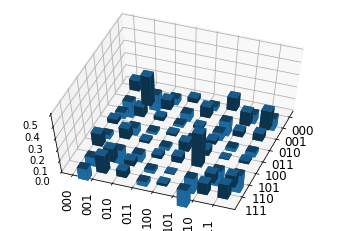

54.375


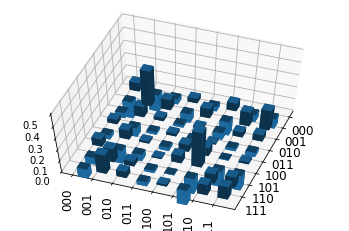

54.75


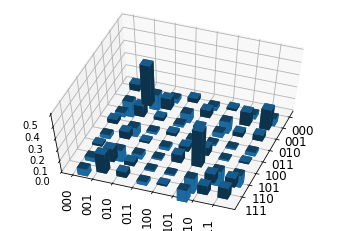

55.125


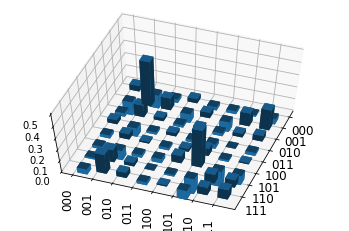

55.5


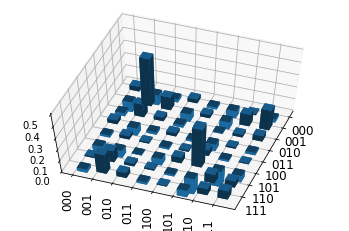

55.875


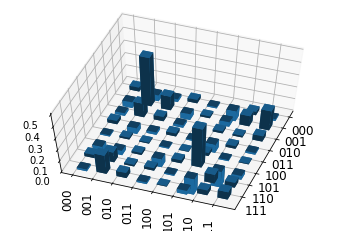

56.25


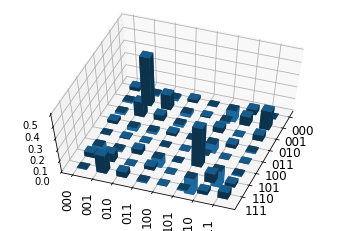

56.625


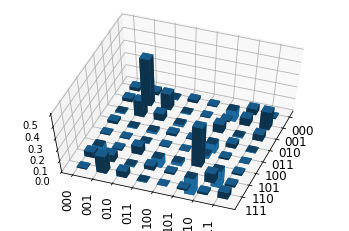

57.0


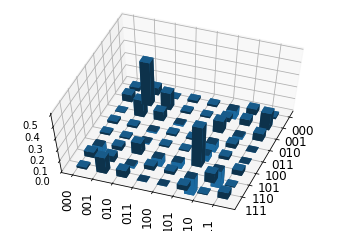

57.375


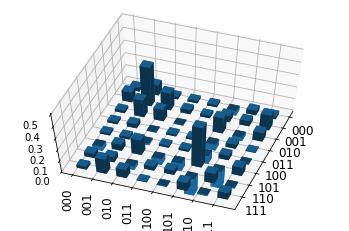

57.75


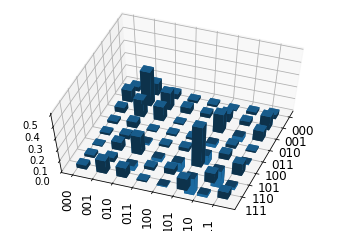

58.125


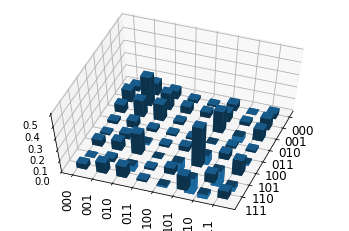

58.5


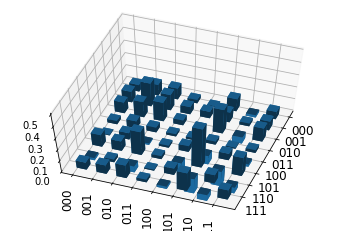

58.875


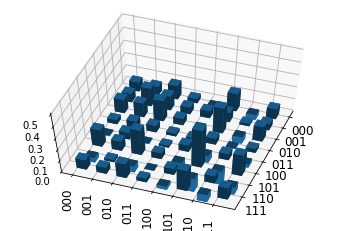

59.25


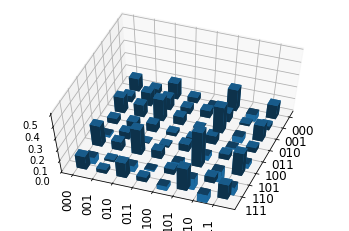

59.625


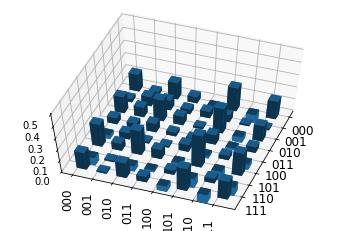

60.0


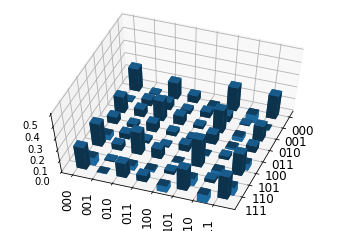

60.375


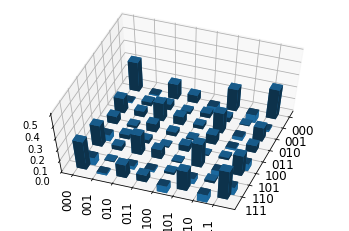

60.75


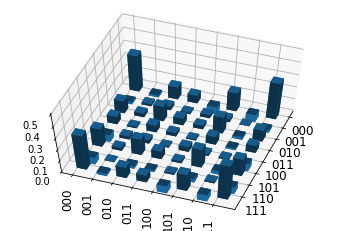

61.125


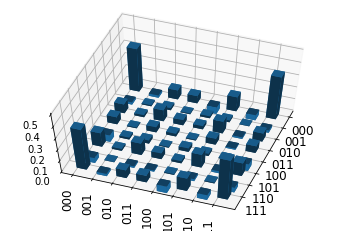

61.5


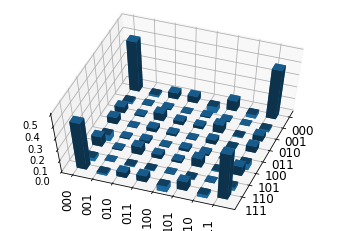

61.875


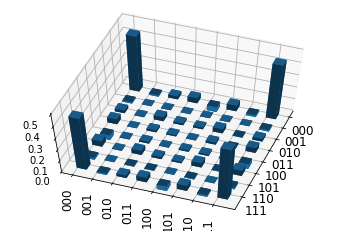

62.25


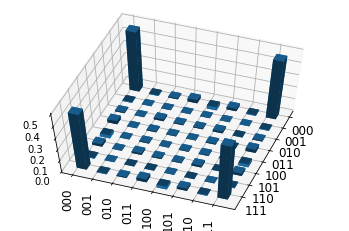

62.625


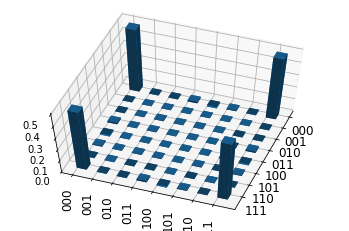

63.0


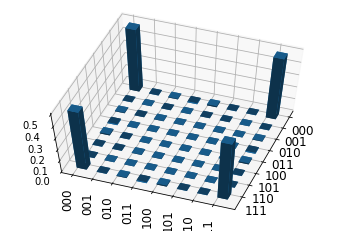

63.375


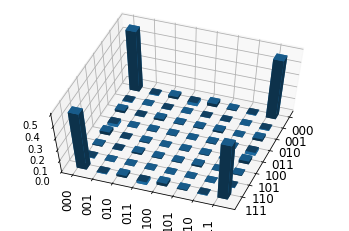

63.75


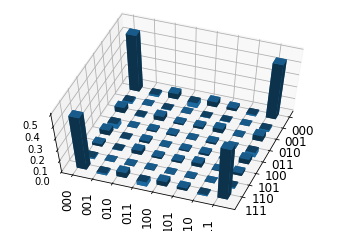

64.125


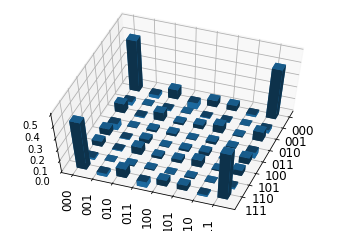

64.5


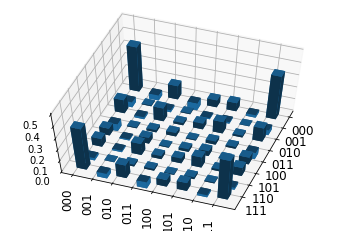

64.875


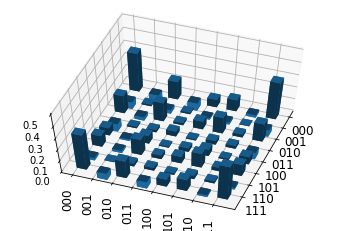

65.25


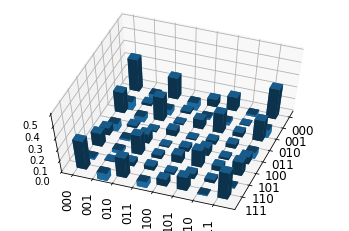

65.625


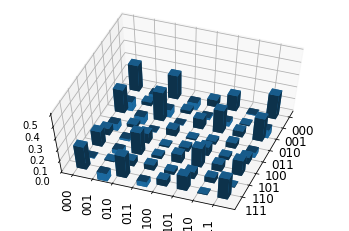

66.0


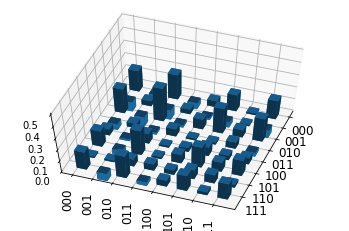

66.375


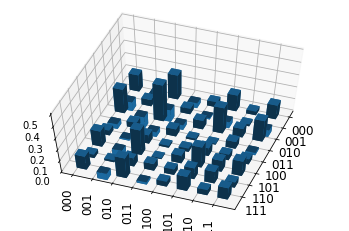

66.75


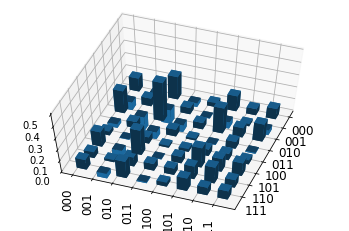

67.125


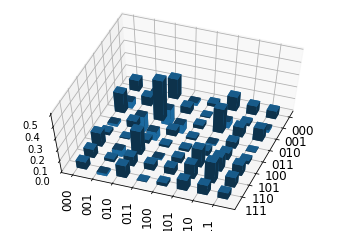

67.5


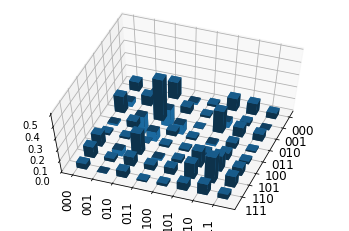

67.875


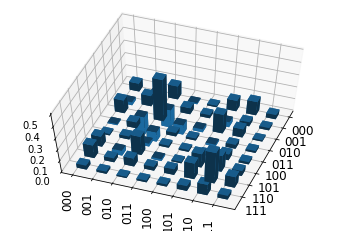

68.25


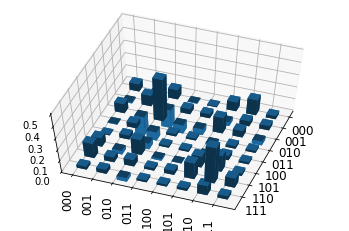

68.625


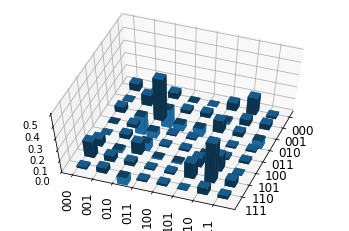

69.0


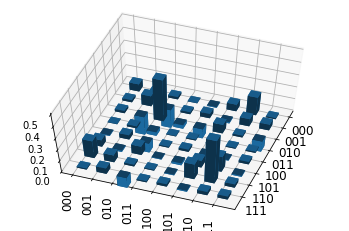

69.375


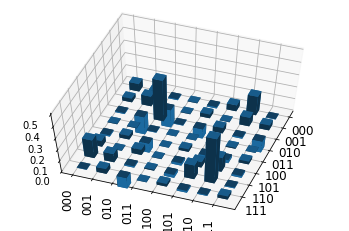

69.75


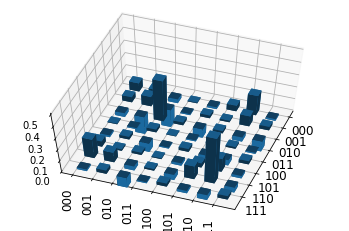

70.125


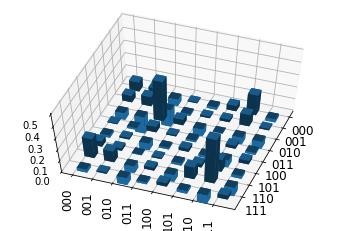

70.5


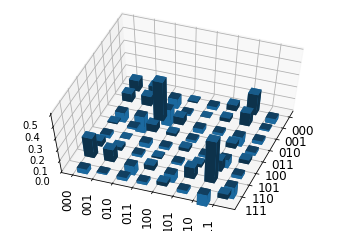

70.875


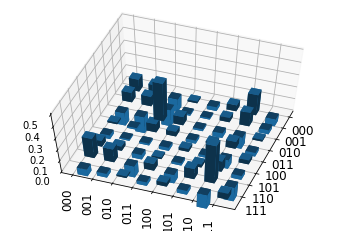

71.25


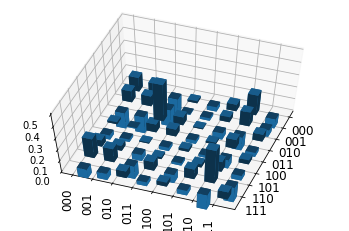

71.625


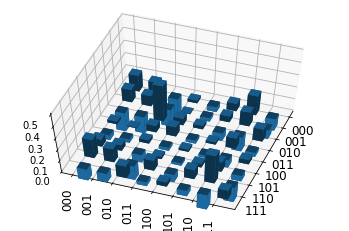

72.0


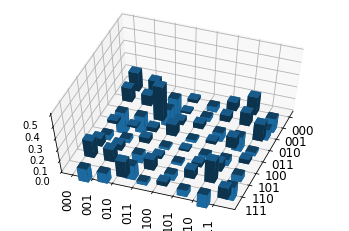

72.375


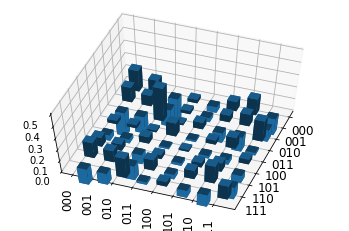

72.75


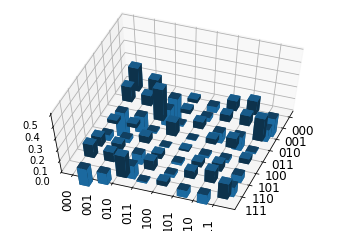

73.125


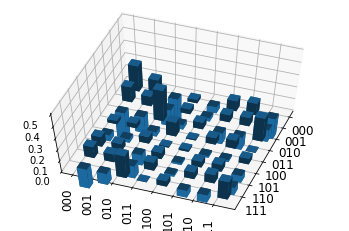

73.5


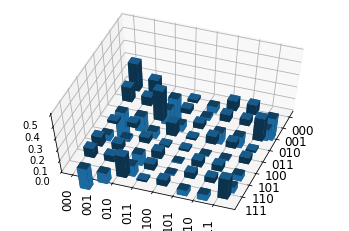

73.875


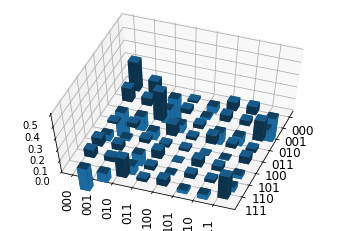

74.25


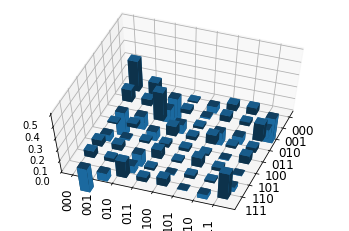

74.625


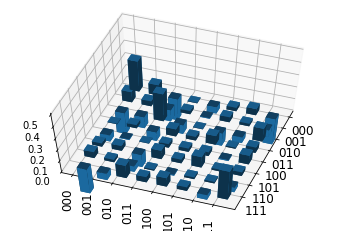

In [27]:
for num,j in enumerate(densities):
    temp=[]
    for i in j.data:
        temp.append(i)
    z = np.array(temp)
    x = np.array(range(0, len(temp)), float) 
    y = x.copy()                     
    xpos, ypos = np.meshgrid(x, y)  
    xpos = xpos.flatten()
    ypos = ypos.flatten()
    zpos = np.zeros_like(xpos)
    dx = 0.5 * np.ones_like(zpos)
    dy = dx.copy()
    dz = z.flatten() # This is the actual data.
    fig = plt.figure()
    ax = fig.add_subplot(111,projection = '3d', xticklabels=['','000','001','010','011','100', '101', '110', '111'],\
                         yticklabels=['','000','001','010','011','100', '101', '110', '111'])
    ax.set_zlim(0.0,0.5)
    ax.bar3d(xpos, ypos, zpos, dx, dy, dz, shade='True')
    ax.view_init(elev=60, azim=20)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12,rotation='vertical')
    print(exp_period[num])
    plt.show()

/opt/conda/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3331: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)


Text(0, 0.5, 'Fidelity')

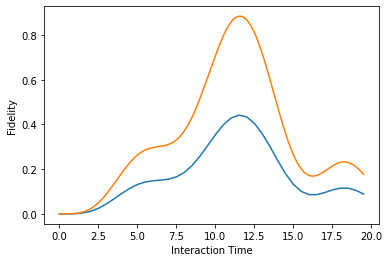

In [115]:

polynomial = np.polyfit(exp_period, fidelities, 21)
Xs_2 = [i/100 for i in range(0,math.ceil(max(exp_period)*100))]
Ys_2 = []
for i in Xs_2:
    Y=0
    for a,j in enumerate(polynomial):
        Y+=j*i**(len(polynomial)-a-1)
    Ys_2.append(2*Y)
#plt.scatter(exp_period, fidelities) 
#plt.plot(exp_period, fidelities)
plt.plot(Xs_2, Ys_2)
plt.xlabel('Interaction Time')
plt.ylabel('Fidelity')


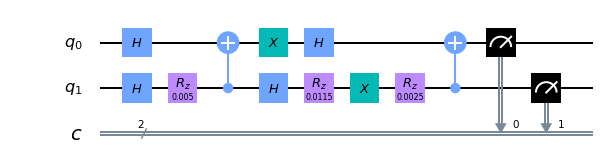

In [12]:
print(data)

{'000': 1024}


In [4]:
from sympy import symbols, solve, diff

def poly_expr(exp_perod,exp_data):
    ##The expression of poly    
    expr = []
    polynomial = np.polyfit(exp_period, exp_data,11)
    for a,i in enumerate(polynomial):
        if i>0:
            expr.append("+"+str(i)+"*x**"+str(len(polynomial)-a-1))
        else:
            expr.append(str(i)+"*x**"+str(len(polynomial)-a-1))
    x = symbols('x')
    eq = ''.join(expr)
    return eq
##The solving of poly

sol = solve(poly_expr(exp_period, data_11)+'-('+poly_expr(exp_period, data_00)+')')
print("Polynomial")
#print(eq)
print("X-intercepts")
for i in sol:
    print(i)



Polynomial
X-intercepts
-3.23943294558864
22.0167790938245
50.8570650585675
0.688346002773722 - 7.29130365480737*I
0.688346002773722 + 7.29130365480737*I
13.4198681222904 - 11.5886234819088*I
13.4198681222904 + 11.5886234819088*I
34.2041995099183 - 10.9563334267979*I
34.2041995099183 + 10.9563334267979*I
46.9795059630114 - 6.05035092809095*I
46.9795059630114 + 6.05035092809095*I


In [27]:
der_eq = diff(poly_expr(exp_period,fidelities))
imaginary = solve(der_eq)
extrema=[]
for i in imaginary:
     extrema.append(float(str(i).split(' ')[0]))
sols=[]
for i in extrema:
    ext=0
    for a,j in enumerate(polynomial):
        ext+=j*i**(len(polynomial)-a-1)
    sols.append(ext)
print('Derivative')
print(der_eq)
print('X turning points')
print(extrema)
print('Y turning points')
print(sols)

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:1: RankWarning: Polyfit may be poorly conditioned
  """Entry point for launching an IPython kernel.


Derivative
6.399574689947617e-21*x**20 - 1.110254887470092e-18*x**19 + 8.063512782178205e-17*x**18 - 3.02154626743985e-15*x**17 + 5.1457659894124409e-14*x**16 + 2.555781842073674e-13*x**15 - 2.7671913286476773e-11*x**14 + 3.4451472558717238e-10*x**13 + 6.248214553938607e-9*x**12 - 2.7786373653973774e-7*x**11 + 4.4493334013523425e-6*x**10 - 3.7666326486092775e-5*x**9 + 0.0001320735446006358*x**8 + 0.0005823605254646171*x**7 - 0.0092850232983822216*x**6 + 0.05013746765706922*x**5 - 0.15085931381914062*x**4 + 0.2685653952566206*x**3 - 0.2458013082393922*x**2 + 0.0091400320079815*x - 0.013608607534156394
X turning points
[-6.38514257525445, 5.92069435088725, 11.5846951587625, 17.7742935984325, 24.2561574073798, 24.8862637188561, -19.6887112823257, -19.6887112823257, -0.0120873860845619, -0.0120873860845619, 1.28646501742888, 1.28646501742888, 6.10133866187861, 6.10133866187861, 15.3417486144748, 15.3417486144748, 21.1514093981526, 21.1514093981526, 23.5457838050869, 23.5457838050869]
Y tur